## SpatialData tutorial - Lab retreat 2024

- Environment used locally (Python version): SpatialData (Python 3.9.19)

#### This tutorial is a summary of some of the features of the SpatialData pacframework. In the end, we will learn how to load Andys Xenium heart data into SpatialData format
1. Use landmark annotations to align multiple -omics layers
2. Technology focus: Xenium
3. Load Xenium data into SpatialData format

#### Load libraries

In [1]:
import spatialdata as sd
from spatialdata import SpatialData, read_zarr, bounding_box_query
from spatialdata.models import ShapesModel
from spatialdata.datasets import raccoon
from spatialdata.transformations import (
    Affine,
    Identity,
    MapAxis,
    Scale,
    Sequence,
    Translation,
    align_elements_using_landmarks,
    get_transformation_between_landmarks,
    BaseTransformation,
    get_transformation,
    set_transformation,
)

import spatialdata_plot

import spatialdata_io
from spatialdata_io import xenium

import napari_spatialdata
from napari_spatialdata import Interactive

import scanpy as sc

import matplotlib.pyplot as plt
import math
import numpy as np
import pandas as pd
from geopandas import GeoDataFrame
from shapely import Polygon
import os
from pathlib import Path
import subprocess
import shutil

#### Unzip the toy data

In [2]:
path = Path().resolve()
path = path / "data"
print(path)

/Users/agrawal/Desktop/retreat/spatialData_helene/data


In [3]:
# Unzip files
folder_map = {
    "Xenium_V1_humanLung_Cancer_FFPE": "Xenium_V1_humanLung_Cancer_FFPE",
    "visium_associated_xenium_io": "visium_associated_xenium_io",
    "xenium_rep1_io": "xenium_rep1_io"
}

# Iterate over each of the folders in the folder map
for folder in folder_map.values():
    # Get the full path to the folder
    folder_path = path / folder
    print(folder_path)

    # Check if the folder exists
    if folder_path.exists() and folder_path.is_dir():
        # Iterate over each file in the folder
        for file in folder_path.iterdir():
            # Unzip the file if it is a zip file
            if file.suffix == ".zip":
                subprocess.run(
                    f"unzip -o {file} -d {folder_path}",
                    shell=True,
                    check=True
                )
    else:
        print(f"Folder {folder_path} does not exist or is not a directory")

/Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE
Archive:  /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/cells.zarr.zip
 extracting: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/.zgroup  
 extracting: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/.zattrs  
 extracting: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/cell_id/.zarray  
 extracting: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/cell_id/0.0  
 extracting: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/cell_id/0.1  
 extracting: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/cell_id/1.0  
 extracting: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/cell_id/1.1  
 extrac

- Convert the Xenium lung cancer data into .zarr SpatialData format

In [4]:
path = Path().resolve()
path = path / "data/Xenium_V1_humanLung_Cancer_FFPE"
print(path)
path_read = path
path_write = path / "data.zarr"

print("parsing the data... ", end="")
sdata = xenium(
    path=str(path_read),
    n_jobs=8,
    cells_boundaries=True,
    nucleus_boundaries=True,
    morphology_focus=True,
)
print("done")

##
print("writing the data... ", end="")
if path_write.exists():
    shutil.rmtree(path_write)
sdata.write(path_write)
print("done")

print(sdata)

/Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE
parsing the data... INFO     reading                                                                                                   
         /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/cell_feature_matrix
         .h5                                                                                                       

 extracting: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/cell_groups/4/indptr/.zarray  
 extracting: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/cell_groups/4/indptr/0  
 extracting: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/cell_groups/5/.zgroup  
 extracting: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/cell_groups/5/indices/.zarray  
 extracting: /Users/agrawal/Desk

/Users/agrawal/miniconda3/envs/SpatialData/lib/python3.9/site-packages/tifffile/tifffile.py:9413: UserWarning: <tifffile.TiffPage 0 @16> reading array from closed file
  warnings.warn(


INFO     The Zarr backing store has been changed from None the new file path:                                      
         /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/data.zarr          
done
SpatialData object, with associated Zarr store: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/data.zarr
├── Images
│     ├── 'he_image': DataTree[cyx] (3, 45087, 11580), (3, 22543, 5790), (3, 11271, 2895), (3, 5635, 1447), (3, 2817, 723)
│     └── 'morphology_focus': DataTree[cyx] (5, 17098, 51187), (5, 8549, 25593), (5, 4274, 12796), (5, 2137, 6398), (5, 1068, 3199)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (17098, 51187), (8549, 25593), (4274, 12796), (2137, 6398), (1068, 3199)
│     └── 'nucleus_labels': DataTree[yx] (17098, 51187), (8549, 25593), (4274, 12796), (2137, 6398), (1068, 3199)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 11) (3D points)
├── Shapes
│     ├── 'cell_bou

In [5]:
!ls data

Xenium_V1_humanLung_Cancer_FFPE
Xenium_V1_humanLung_Cancer_FFPE_outs.zip
visium_associated_xenium_io
visium_associated_xenium_io.zip
xenium_rep1_io
xenium_rep1_io.zip


In [6]:
!ls data/Xenium_V1_humanLung_Cancer_FFPE/data.zarr

images    labels    points    shapes    tables    zmetadata


#### Load the toy data

- For this tutorial, we will use three datasets:
1. The 10x Xenium data from human lung cancer (saved as sdata in the following)
2. Breast cancer data derived from a visium and xenium experiment (saved as xenium_sdata and visium_sdata)

In [7]:
sdata = sd.read_zarr("data/Xenium_V1_humanLung_Cancer_FFPE/data.zarr")
print(sdata)

SpatialData object, with associated Zarr store: /Users/agrawal/Desktop/retreat/spatialData_helene/data/Xenium_V1_humanLung_Cancer_FFPE/data.zarr
├── Images
│     ├── 'he_image': DataTree[cyx] (3, 45087, 11580), (3, 22543, 5790), (3, 11271, 2895), (3, 5635, 1447), (3, 2817, 723)
│     └── 'morphology_focus': DataTree[cyx] (5, 17098, 51187), (5, 8549, 25593), (5, 4274, 12796), (5, 2137, 6398), (5, 1068, 3199)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (17098, 51187), (8549, 25593), (4274, 12796), (2137, 6398), (1068, 3199)
│     └── 'nucleus_labels': DataTree[yx] (17098, 51187), (8549, 25593), (4274, 12796), (2137, 6398), (1068, 3199)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 11) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (162254, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (162254, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (156628, 1) (2D shapes)
└── Tables
      └── 'table': AnnData

/Users/agrawal/miniconda3/envs/SpatialData/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [8]:
# Load the breast cancer visium and xenium data
visium_sdata = read_zarr("data/visium_associated_xenium_io/data.zarr")
print(visium_sdata)

xenium_sdata = read_zarr("data/xenium_rep1_io/data.zarr")
print(xenium_sdata)

SpatialData object, with associated Zarr store: /Users/agrawal/Desktop/retreat/spatialData_helene/data/visium_associated_xenium_io/data.zarr
├── Images
│     ├── 'CytAssist_FFPE_Human_Breast_Cancer_full_image': DataTree[cyx] (3, 21571, 19505), (3, 10785, 9752), (3, 5392, 4876), (3, 2696, 2438), (3, 1348, 1219)
│     ├── 'CytAssist_FFPE_Human_Breast_Cancer_hires_image': DataArray[cyx] (3, 2000, 1809)
│     └── 'CytAssist_FFPE_Human_Breast_Cancer_lowres_image': DataArray[cyx] (3, 600, 543)
├── Shapes
│     └── 'CytAssist_FFPE_Human_Breast_Cancer': GeoDataFrame shape: (4992, 2) (2D shapes)
└── Tables
      └── 'table': AnnData (4992, 18085)
with coordinate systems:
    ▸ 'downscaled_hires', with elements:
        CytAssist_FFPE_Human_Breast_Cancer_hires_image (Images), CytAssist_FFPE_Human_Breast_Cancer (Shapes)
    ▸ 'downscaled_lowres', with elements:
        CytAssist_FFPE_Human_Breast_Cancer_lowres_image (Images), CytAssist_FFPE_Human_Breast_Cancer (Shapes)
    ▸ 'global', with elemen

/Users/agrawal/miniconda3/envs/SpatialData/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


- Link to spatialdata vignette: https://spatialdata.scverse.org/en/latest/index.html

- Link to to spatialdata_io vignette, the library to load custom spatial data: https://spatialdata.scverse.org/projects/io/en/latest/index.html

### Part 0: The basics - are all about racooons 🦝

##### Load racoons

INFO     Transposing `data` of type: <class 'dask.array.core.Array'> to ('c', 'y', 'x').                           
SpatialData object
├── Images
│     └── 'raccoon': DataArray[cyx] (3, 768, 1024)
├── Labels
│     └── 'segmentation': DataArray[yx] (768, 1024)
└── Shapes
      └── 'circles': GeoDataFrame shape: (4, 2) (2D shapes)
with coordinate systems:
    ▸ 'global', with elements:
        raccoon (Images), segmentation (Labels), circles (Shapes)


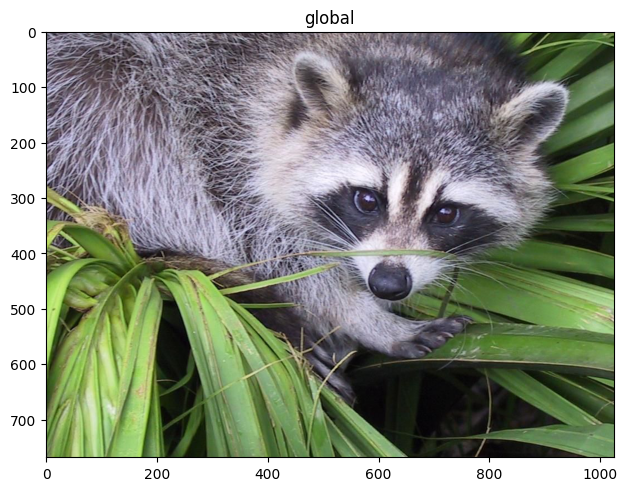

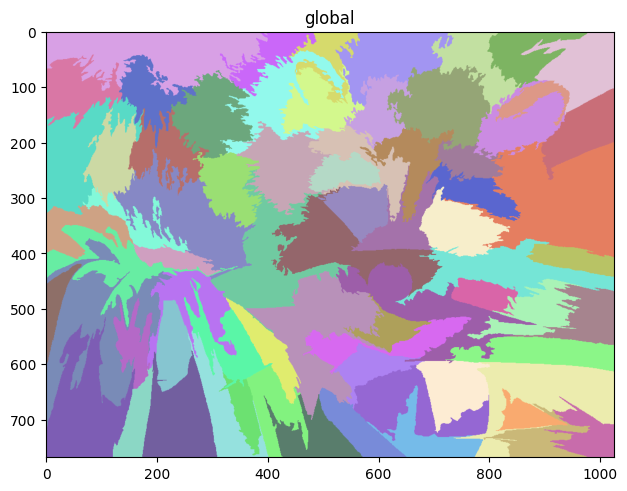

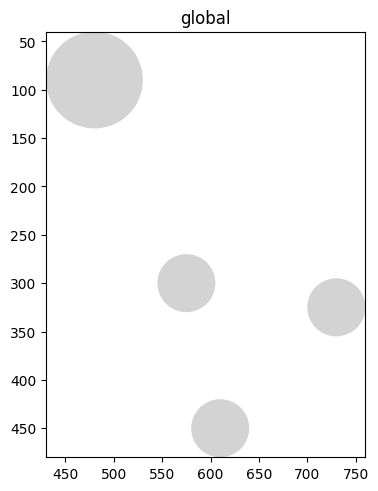

In [9]:
# Import an image

# 1. Racoon
rc = raccoon()
print(rc)
rc.pl.render_images().pl.show()

# 2. Create a segmentation mask
rc.pl.render_labels().pl.show()

# 3. Create some shapes
rc.pl.render_shapes().pl.show()

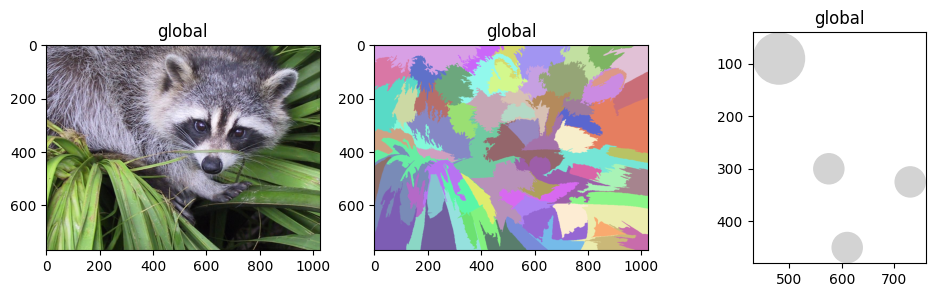

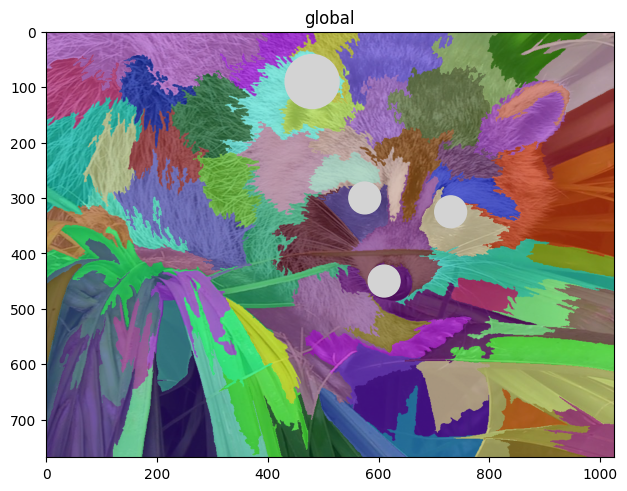

In [10]:
# Overlay the images
fig, axs = plt.subplots(ncols=3, figsize=(12, 3))

rc.pl.render_images().pl.show(ax=axs[0])
rc.pl.render_labels().pl.show(ax=axs[1])
rc.pl.render_shapes().pl.show(ax=axs[2])

rc.pl.render_images().pl.render_labels().pl.render_shapes().pl.show()

In [11]:
print(rc.coordinate_systems)
print(
    get_transformation(rc.images["raccoon"]),
    get_transformation(rc.labels["segmentation"]),
    get_transformation(rc.shapes["circles"]),
)

['global']
Identity  Identity  Identity 


##### Transform racoons! 🧟

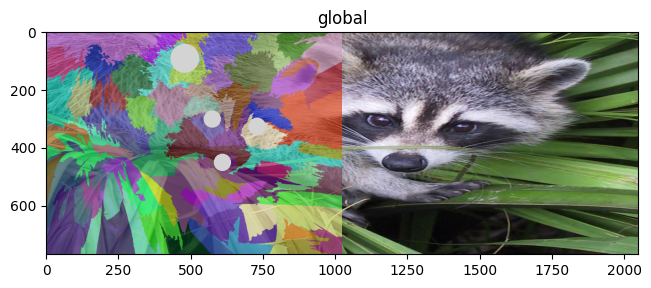

In [12]:
# Create a new transformation.  Scale the "x" axis by a factor of 2

scale = Scale([2.0], axes=("x",))

set_transformation(rc.images["raccoon"], scale, to_coordinate_system="global")

rc.pl.render_images().pl.render_labels().pl.render_shapes().pl.show()

1. Permute the racoon's axis, rotate racoons, transform racoons

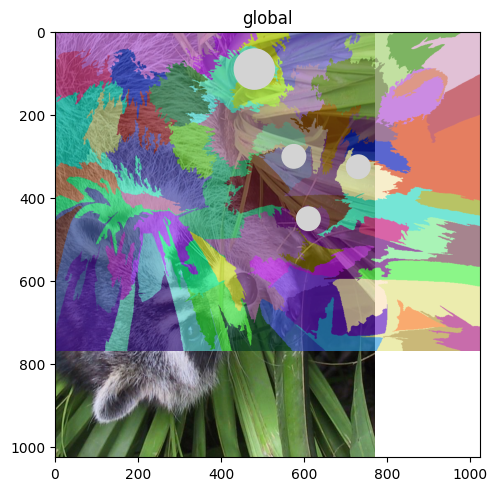

In [13]:
# Permute the axis
map_axis = MapAxis({"x": "y", "y": "x"})

set_transformation(rc.images["raccoon"], map_axis, to_coordinate_system="global")

rc.pl.render_images().pl.render_labels().pl.render_shapes().pl.show()

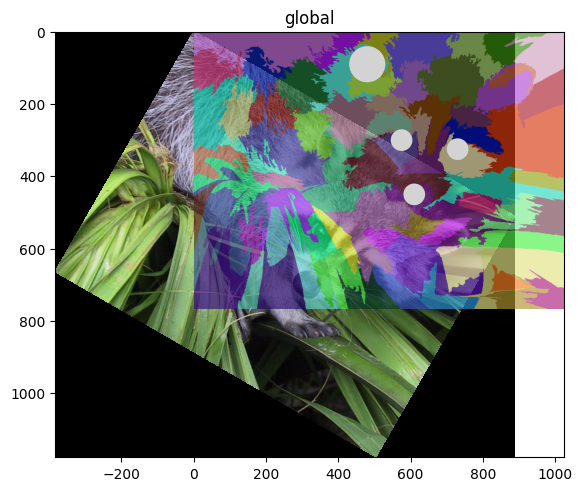

In [14]:
# Rotate the image
theta = math.pi / 6
rotation = Affine(
    [
        [math.cos(theta), -math.sin(theta), 0],
        [math.sin(theta), math.cos(theta), 0],
        [0, 0, 1],
    ],
    input_axes=("x", "y"),
    output_axes=("x", "y"),
)

set_transformation(rc.images["raccoon"], rotation, to_coordinate_system="global")

rc.pl.render_images().pl.render_labels().pl.render_shapes().pl.show()

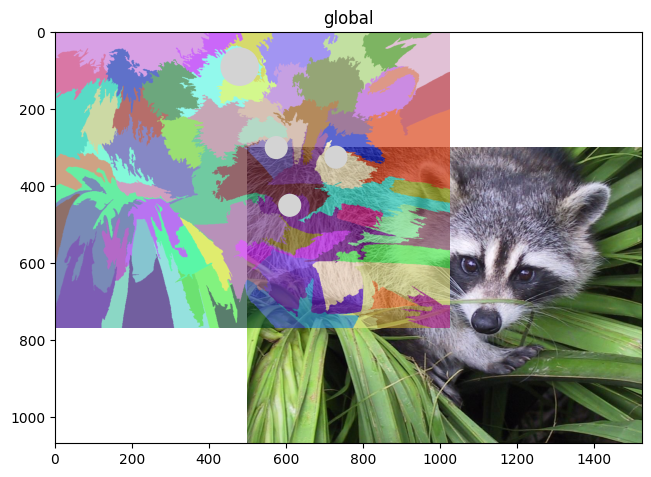

In [15]:
# Translate the racoon

translation = Translation([500, 300], axes=("x", "y"))

set_transformation(rc.images["raccoon"], translation, to_coordinate_system="global")

rc.pl.render_images().pl.render_labels().pl.render_shapes().pl.show()

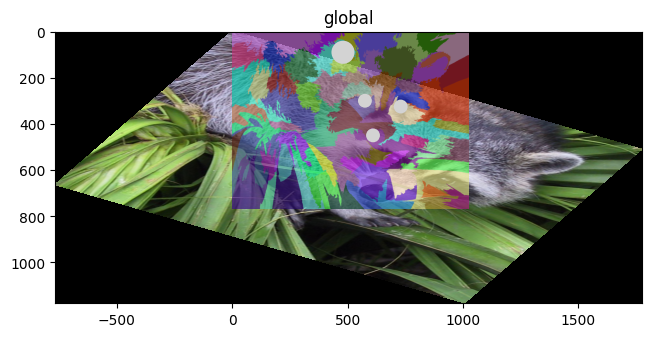

In [16]:
# Affine transformation of the racoon
sequence = Sequence([rotation, scale])

set_transformation(rc.images["raccoon"], sequence, to_coordinate_system="global")

rc.pl.render_images().pl.render_labels().pl.render_shapes().pl.show()

WARNING  The vector part of the transformation matrix is not isotropic, the radius will be scaled by the average of
         the modules of eigenvalues of the affine transformation matrix.                                           
         matrix=[[2. 0. 0.]                                                                                        
          [0. 1. 0.]                                                                                               
          [0. 0. 1.]]                                                                                              
         eigenvalues=[2. 1.]                                                                                       
         scale_factor=1.5                                                                                          


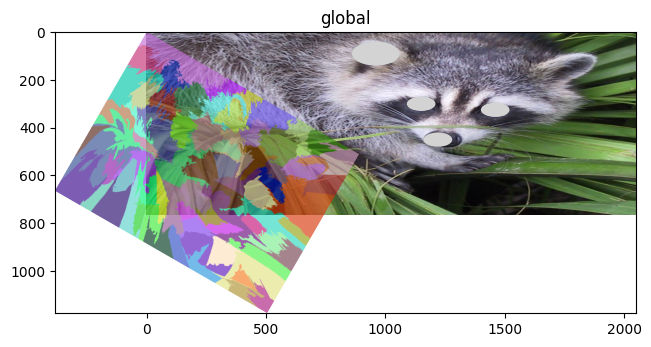

In [17]:
# Apply transformation across different elements

set_transformation(rc.images["raccoon"], scale, to_coordinate_system="global")
set_transformation(rc.shapes["circles"], scale, to_coordinate_system="global")
set_transformation(rc.labels["segmentation"], rotation, to_coordinate_system="global")

rc.pl.render_images().pl.render_labels().pl.render_shapes().pl.show()

There are many other functions in the spatialdata package, you can find out more in their vignette: https://spatialdata.scverse.org/en/latest/tutorials/notebooks/notebooks.html

### Part 1: Use landmark annotations to align multiple -omics layers

- Here we use the visium and xenium data from breast cancer tissue

In [18]:
# Interactive([visium_sdata, xenium_sdata])

- Excurs on napari: https://napari.org/stable/#


- In the following, we will use coordinates for points in spatial data that are already provided by the authors, to make the tutorial comparable 

In [19]:
visium_landmarks = ShapesModel.parse(
    np.array([[10556.699, 7829.764], [13959.155, 13522.025], [10621.200, 17392.116]]), geometry=0, radius=500
)
visium_sdata["visium_landmarks"] = visium_landmarks

xenium_landmarks = ShapesModel.parse(
    np.array([[9438.385, 13933.017], [24847.866, 5948.002], [34082.584, 15234.235]]), geometry=0, radius=500
)
xenium_sdata["xenium_landmarks"] = xenium_landmarks

In [20]:
affine = get_transformation_between_landmarks(
    references_coords=xenium_sdata["xenium_landmarks"], moving_coords=visium_sdata["visium_landmarks"]
)
affine

Affine (x, y -> x, y)
    [ 1.61711846e-01  2.58258090e+00 -1.24575040e+04]
    [-2.58258090e+00  1.61711846e-01  3.98647301e+04]
    [0. 0. 1.]

- Align spatial data from both technologies

In [21]:
affine = align_elements_using_landmarks(
    references_coords=xenium_sdata["xenium_landmarks"],
    moving_coords=visium_sdata["visium_landmarks"],
    reference_element=xenium_sdata["morphology_mip"],
    moving_element=visium_sdata["CytAssist_FFPE_Human_Breast_Cancer_full_image"],
    reference_coordinate_system="global",
    moving_coordinate_system="global",
    new_coordinate_system="aligned",
)
affine

Sequence 
    Identity 
    Affine (x, y -> x, y)
        [ 1.61711846e-01  2.58258090e+00 -1.24575040e+04]
        [-2.58258090e+00  1.61711846e-01  3.98647301e+04]
        [0. 0. 1.]

In [22]:
# Interactive([visium_sdata, xenium_sdata])

- Align other elements from the dataset

In [23]:
def postpone_transformation(
    sdata: SpatialData,
    transformation: BaseTransformation,
    source_coordinate_system: str,
    target_coordinate_system: str,
):
    for element_type, element_name, element in sdata._gen_elements():
        old_transformations = get_transformation(element, get_all=True)
        if source_coordinate_system in old_transformations:
            old_transformation = old_transformations[source_coordinate_system]
            sequence = Sequence([old_transformation, transformation])
            set_transformation(element, sequence, target_coordinate_system)


postpone_transformation(
    sdata=visium_sdata,
    transformation=affine,
    source_coordinate_system="global",
    target_coordinate_system="aligned",
)

In [24]:
#Interactive([visium_sdata, xenium_sdata])

### Part 2: Technology focus: Xenium

In the following we will work with the 10x lung cancer data derived from the Xenium experiment

- Plot the images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.457285659361784].


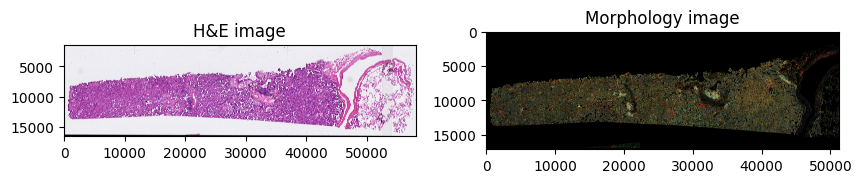

In [25]:
axes = plt.subplots(1, 2, figsize=(10, 10))[1].flatten()
sdata.pl.render_images("he_image").pl.show(ax=axes[0], title="H&E image")
sdata.pl.render_images("morphology_focus").pl.show(ax=axes[1], title="Morphology image")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011904762..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.792156862745098].


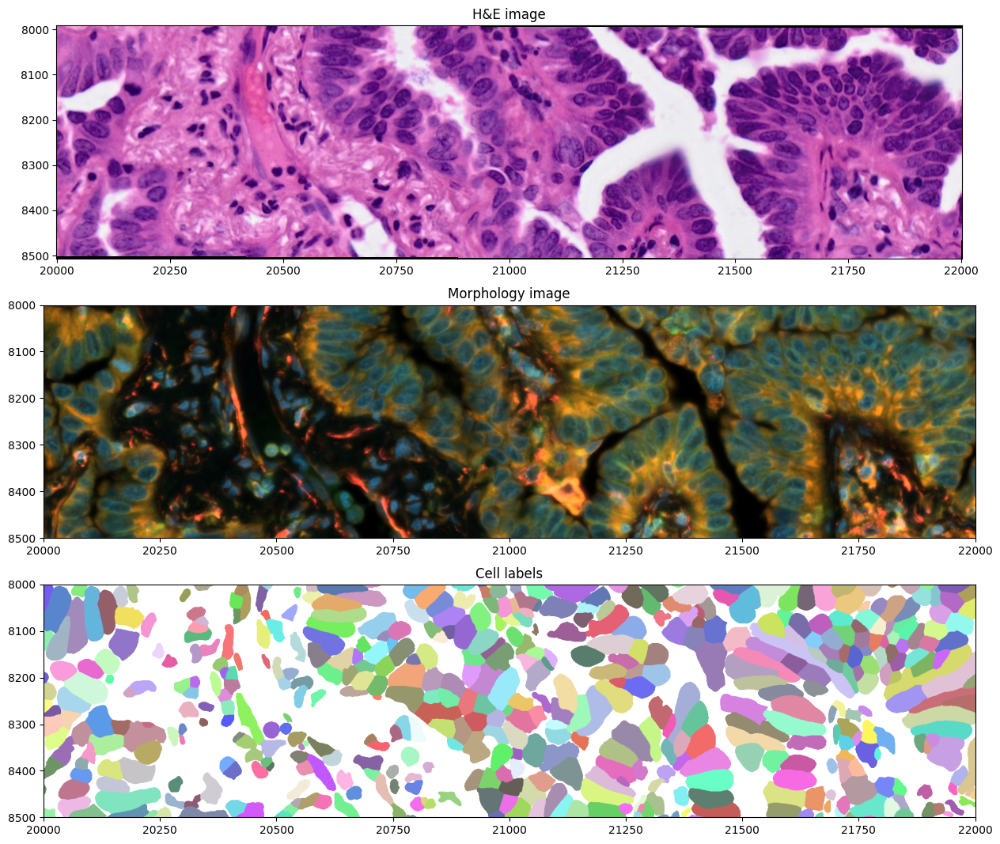

In [26]:
axes = plt.subplots(3, 1, figsize=(20, 13))[1].flatten()
crop0 = lambda x: bounding_box_query(
    x,
    min_coordinate=[20_000, 8000],
    max_coordinate=[22_000, 8500],
    axes=("x", "y"),
    target_coordinate_system="global",
)
crop0(sdata).pl.render_images("he_image").pl.show(ax=axes[0], title="H&E image", coordinate_systems="global")
crop0(sdata).pl.render_images("morphology_focus").pl.show(
    ax=axes[1], title="Morphology image", coordinate_systems="global"
)
crop0(sdata).pl.render_labels("cell_labels").pl.show(ax=axes[2], title="Cell labels", coordinate_systems="global")

- Exploring multimodal segmentation

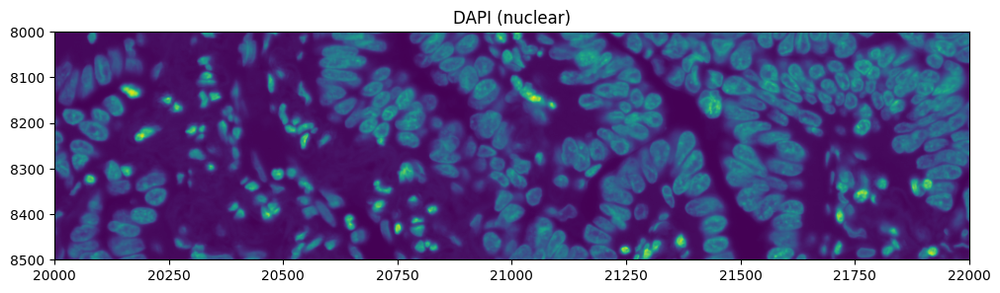

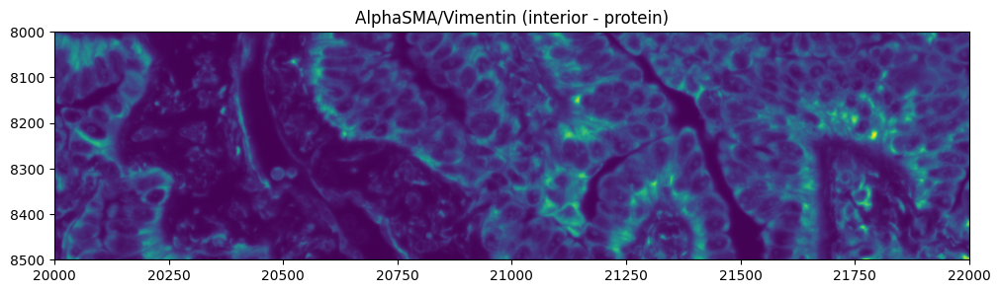

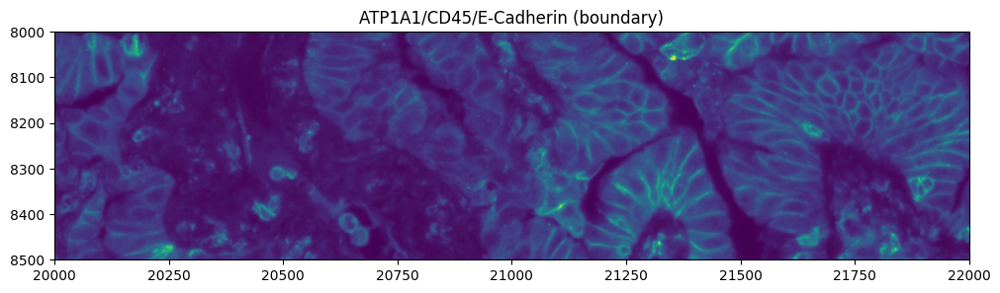

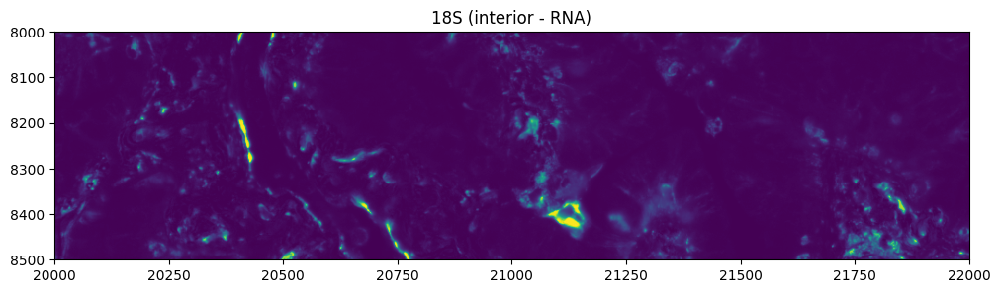

In [27]:
crop0(sdata).pl.render_images("morphology_focus", channel=0).pl.show(title="DAPI (nuclear)", figsize=(10, 10))
crop0(sdata).pl.render_images("morphology_focus", channel=1).pl.show(
    title="AlphaSMA/Vimentin (interior - protein)", figsize=(10, 10)
)
crop0(sdata).pl.render_images("morphology_focus", channel=2).pl.show(
    title="ATP1A1/CD45/E-Cadherin (boundary)", figsize=(10, 10)
)
crop0(sdata).pl.render_images("morphology_focus", channel=3).pl.show(title="18S (interior - RNA)", figsize=(10, 10))

- Plotting the gene expression data

In [28]:
sc.pp.normalize_total(sdata.tables["table"])
sc.pp.log1p(sdata.tables["table"])
sc.pp.highly_variable_genes(sdata.tables["table"])
sdata.tables["table"].var.sort_values("means")

/Users/agrawal/miniconda3/envs/SpatialData/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:234: UserWarning: Some cells have zero counts
  warn(UserWarning("Some cells have zero counts"))


,gene_ids,feature_types,genome,highly_variable,means,dispersions,dispersions_norm
UMOD,ENSG00000169344,Gene Expression,Unknown,False,0.000855,0.733388,0.142545
LY6D,ENSG00000167656,Gene Expression,Unknown,False,0.001364,0.557849,-0.404188
SST,ENSG00000157005,Gene Expression,Unknown,False,0.001424,0.184340,-1.567515
TCF15,ENSG00000125878,Gene Expression,Unknown,False,0.001587,0.189523,-1.551373
CCL27,ENSG00000213927,Gene Expression,Unknown,False,0.001663,0.526737,-0.501089
...,...,...,...,...,...,...,...
CAPN8,ENSG00000203697,Gene Expression,Unknown,True,0.859493,1.032884,1.000000
EPCAM,ENSG00000119888,Gene Expression,Unknown,False,0.897788,0.938736,-0.707107
TCIM,ENSG00000176907,Gene Expression,Unknown,True,0.948361,1.136240,0.707107
CYP2B6,ENSG00000197408,Gene Expression,Unknown,True,0.989477,1.524039,1.000000


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.7949404075355633].


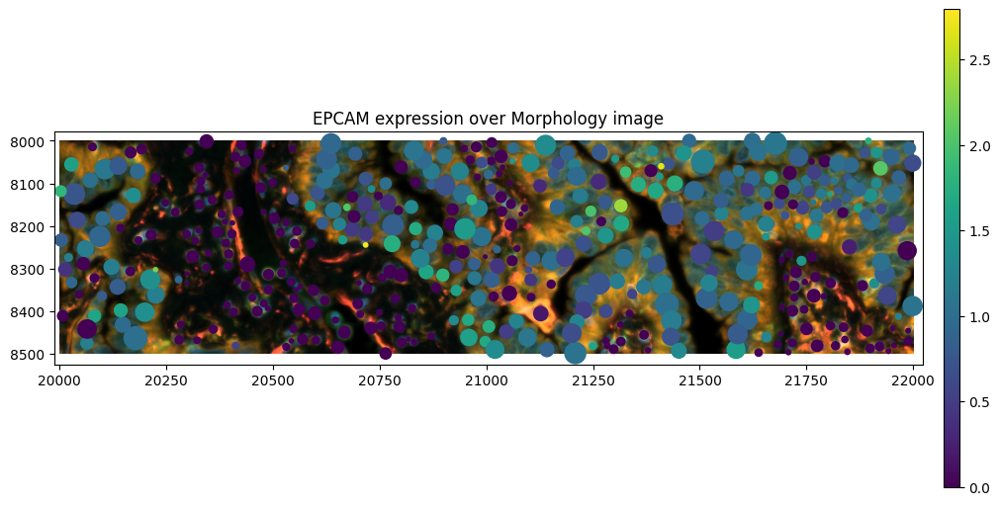

In [29]:
gene_name = "EPCAM"
crop0(sdata).pl.render_images("morphology_focus").pl.render_shapes(
    "cell_circles",
    color=gene_name,
).pl.show(title=f"{gene_name} expression over Morphology image", coordinate_systems="global", figsize=(10, 5))

/Users/agrawal/miniconda3/envs/SpatialData/lib/python3.9/site-packages/spatialdata/_core/spatialdata.py:474: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14864865..1.0].


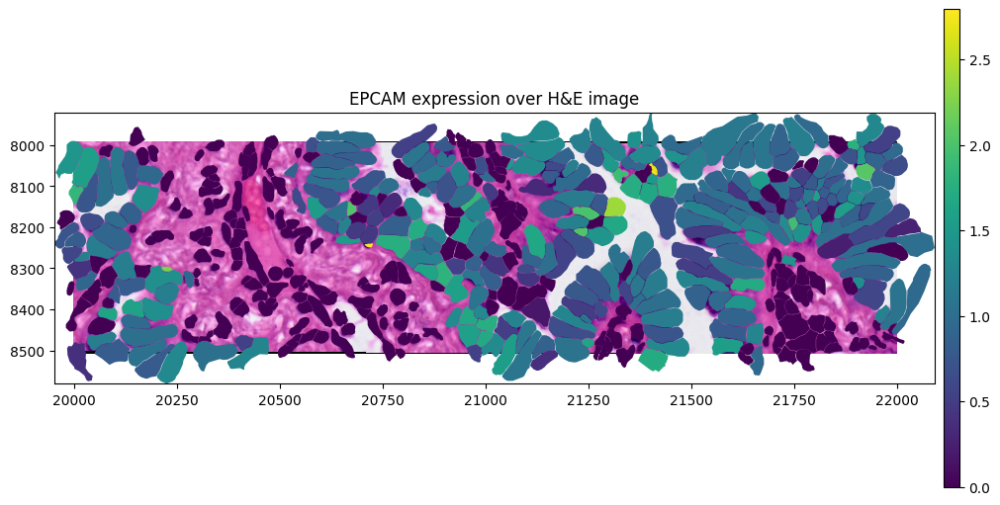

In [30]:
sdata.tables["table"].obs["region"] = "cell_boundaries"
sdata.set_table_annotates_spatialelement("table", region="cell_boundaries")

crop0(sdata).pl.render_images("he_image").pl.render_shapes(
    "cell_boundaries",
    color=gene_name,
).pl.show(title=f"{gene_name} expression over H&E image", coordinate_systems="global", figsize=(10, 5))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14864865..1.0].
/Users/agrawal/miniconda3/envs/SpatialData/lib/python3.9/site-packages/anndata/_core/anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/Users/agrawal/miniconda3/envs/SpatialData/lib/python3.9/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/agrawal/miniconda3/envs/SpatialData/lib/python3.9/site-packages/spatialdata/_core/_elements.py:106: UserWarning: Key `transcripts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/Users/agrawal/miniconda3/envs/SpatialData/lib/python3.9/site-packages/spatialdata_plot/pl/utils.py:718: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.C

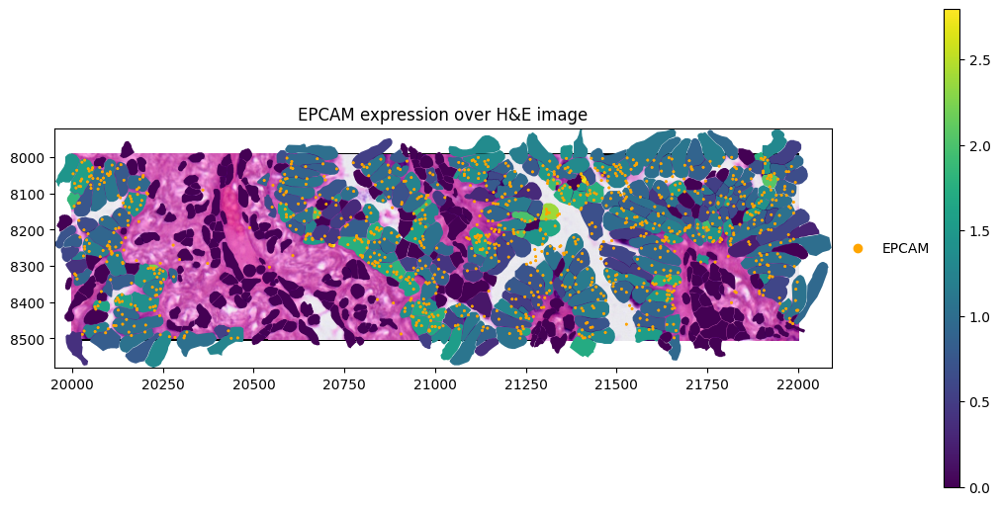

In [31]:
crop0(sdata).pl.render_images("he_image").pl.render_shapes(
    "cell_boundaries",
    color=gene_name,
).pl.render_points(
    "transcripts",
    color="feature_name",
    groups=gene_name,
    palette="orange",
).pl.show(title=f"{gene_name} expression over H&E image", coordinate_systems="global", figsize=(10, 5))

### Part 3: Example: How to create a SpatialData object

- Load Xenium data from Andys heart atlas

In [32]:
# sdata = spatialdata_io.xenium("/Users/helene/Documents/Data/Andy/Spatial-analysis-publication_Xenium/Data/adult_MI_D7__output-XETG00051__0014555__S159486__20240508__115526")

In [33]:
# write the data to disk
# sdata.write("/Users/helene/Documents/Data/Andy/Spatial-analysis-publication_Xenium/Data/20240703_Test-SpatialData-Andys-Heart-data.zarr")

# read and print the Zarr data
#sdata = sd.read_zarr("/Users/helene/Documents/Data/Andy/Spatial-analysis-publication_Xenium/Data/20240703_Test-SpatialData-Andys-Heart-data.zarr")

In [34]:
# sdata